In [1]:
import matplotlib.pyplot as plt
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

import matplotlib as mpl
# enables correct plotting of text
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42 

import scanpy.external as sce

In [2]:
import session_info
session_info.show()

/home/kk837/.conda/envs/generic_env/lib/python3.10/site-packages/session_info/main.py:213: UserWarning: The '__version__' attribute is deprecated and will be removed in MarkupSafe 3.1. Use feature detection, or `importlib.metadata.version("markupsafe")`, instead.
  mod_version = _find_version(mod.__version__)


In [4]:
import importlib.util
import sys
spec = importlib.util.spec_from_file_location("module.name", "/home/kk837/rfs/rfs-teichlab-nfs-iCNyzSAaucw/kk837/function/python/utils.py")
utils = importlib.util.module_from_spec(spec)
sys.modules["module.name"] = utils
spec.loader.exec_module(utils)

In [5]:
sc.settings.set_figure_params(dpi=80)

# Variables

In [6]:
adata_dir = '/home/kk837/rds/rds-teichlab-C9woKbOCf2Y/kk837/Foetal/anndata_objects/Xenium/subsets'
sample_id = 'C194-HEA-0-FFPE-1_Hst45-HEA-0-FFPE-1_concat'
celltype = 'Neurons'

In [ ]:
# figdir = '/nfs/team205/heart/fetal_ms_figures/raw_plots_kk/Aug2024'
# table_dir = '/nfs/team205/heart/fetal_ms_figures/tables/Aug2024'

In [7]:
latent_space = 'pca_harmony'

# Read in data

In [8]:
# read in
adata = sc.read_h5ad(f'{adata_dir}/{sample_id}_5K_{celltype}_lognorm.h5ad')
adata

AnnData object with n_obs × n_vars = 1992 × 4270
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'n_genes', 'tissue_block_id', 'celltypist_coarse', 'conf_score_coarse', 'celltypist_coarse_fin', 'celltypist_coarse2midmod', 'conf_score_coarse2midmod', 'celltypist_mid_fin', 'celltypist_midmod2fine', 'conf_score_midmod2fine', 'pca_harmony_leiden_0.2', 'pca_harmony_leiden_0.3', 'pca_harmony_leiden_0.4', 'pca_harmony_leiden_0.5', 'pca_harmony_leiden_0.8', 'pca_harmony_leiden_1.0', 'pca_harmony_leiden_1.5', 'pca_harmony_leiden_2.0', 'pca_harmony_leiden_3.

In [9]:
adata.X.data[:5]

array([3.4320538, 3.4320538, 4.1089087, 3.4320538, 3.4320538],
      dtype=float32)

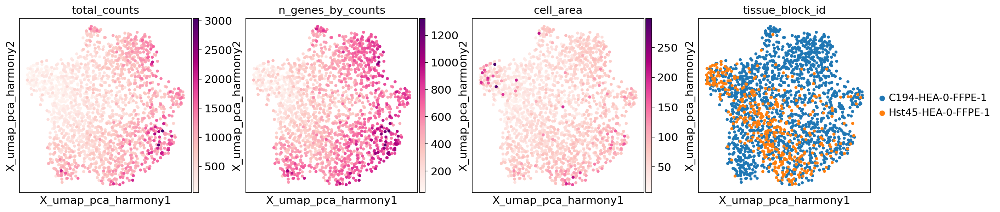

In [10]:
sc.pl.embedding(adata, basis=f"X_umap_{latent_space}",
                color=['total_counts','n_genes_by_counts','cell_area','tissue_block_id'],
                    wspace=0.2,cmap='RdPu',vmax='p100')

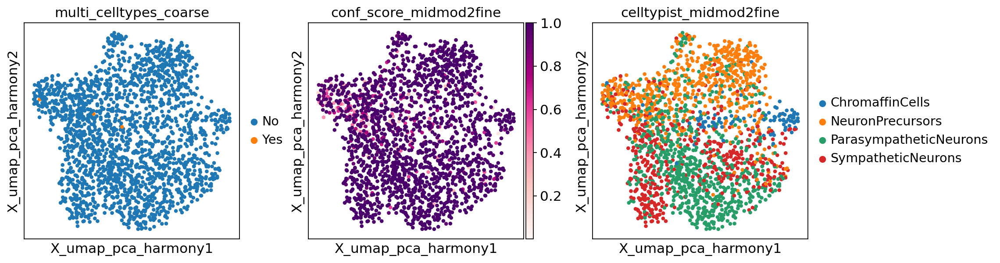

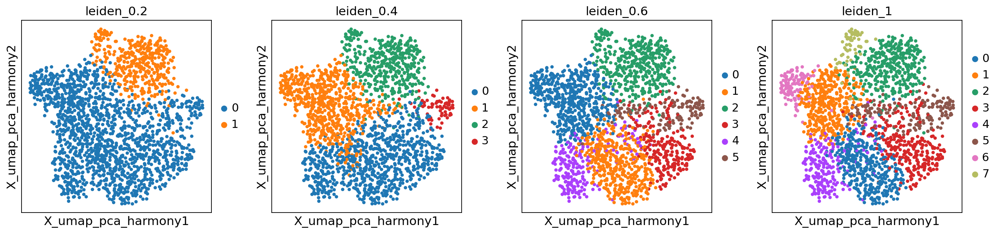

In [11]:
sc.pl.embedding(adata, basis=f"X_umap_{latent_space}",
                color=['multi_celltypes_coarse',"conf_score_midmod2fine","celltypist_midmod2fine",],
                    wspace=0.2,cmap='RdPu',vmax='p100')
resolutions_list = [0.2,0.4,0.6,1]
sc.pl.embedding(adata, basis=f"X_umap_{latent_space}",
                    color=[f'leiden_{str(resolution)}' for resolution in resolutions_list],
                    wspace=0.2)

<timed exec>:5: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.


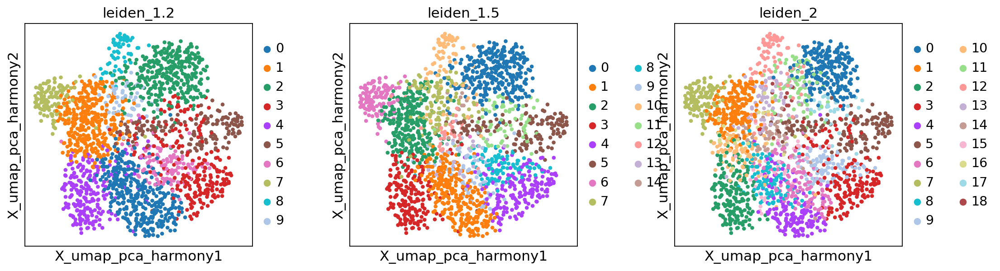

CPU times: user 1.46 s, sys: 62.3 ms, total: 1.52 s
Wall time: 1.52 s


In [12]:
%%time
# leiden clustering
resolutions_list = [# 0.2,0.4,0.6,1, # already done
                    1.2,1.5,2]
for resolution in resolutions_list:
    sc.tl.leiden(adata,neighbors_key=latent_space,
                     resolution=resolution,key_added=f'leiden_{str(resolution)}',n_iterations=2)
sc.pl.embedding(adata, basis=f"X_umap_{latent_space}",
                color=[f'leiden_{str(resolution)}' for resolution in resolutions_list],
                wspace=0.3)

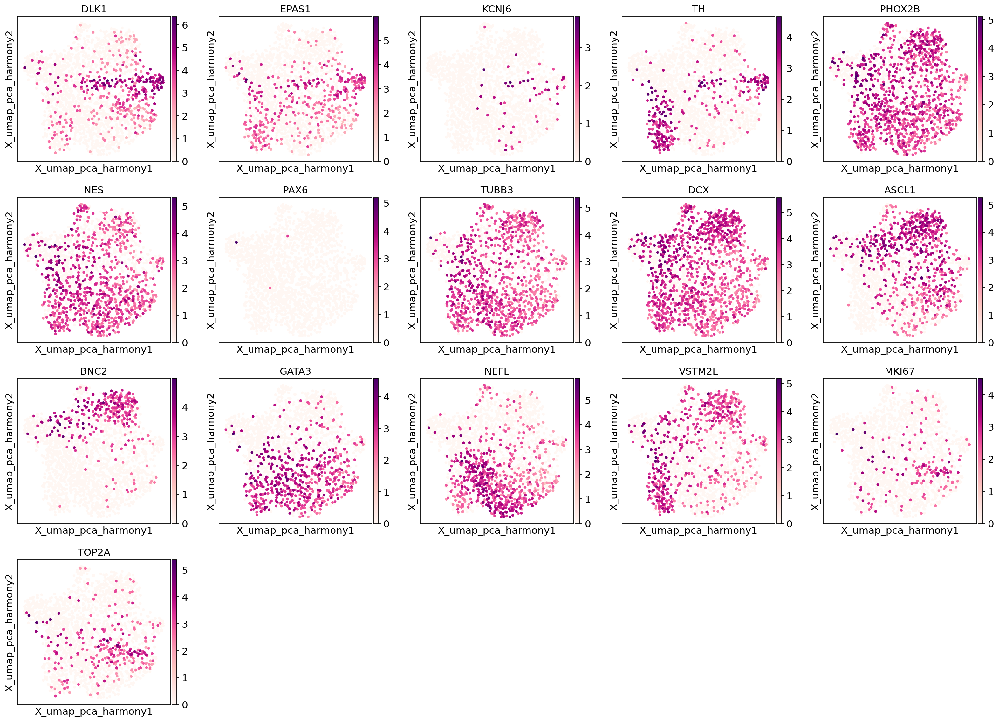

In [13]:
# markers for fine-grained cell types
markers = {
    "ChromaffinCells": [
        'DLK1',
        'EPAS1',
        'KCNJ6',
        "TH",    # Tyrosine hydroxylase
        "PNMT",  # Phenylethanolamine N-methyltransferase
        "CHGA",  # Chromogranin A
        "CHGB",  # Chromogranin B
        "PHOX2B"
    ],
    "NeuronPrecursors": [
        "NES",    # Nestin
        "PAX6",   # Paired box 6
        "TUBB3",  # Tubulin Beta 3 Class III
        "DCX",     # Doublecortin
        'ASCL1','NELL2','BNC2'
    ],
    "ParasympatheticNeurons": [
        "PHOX2B",
        "CHAT",    # Choline O-Acetyltransferase
        "SLC18A3", # Solute Carrier Family 18 Member A3 (Vesicular Acetylcholine Transporter)
        "GATA3",
        'NEFL','SST'
    ],
    "SympatheticNeurons": [
        "TH",
        "PHOX2B",
        "GATA3",
        "CHGA",
        "CHGB",
        'DBH','VSTM2L'
    ],
    'Cycling':['MKI67','TOP2A']
}
genes = []
for g in markers.values():
    genes = genes + [x for x in g if (x in adata.var_names)&(x not in genes)]
for key in markers.keys():
    markers[key]=[x for x in markers[key] if x in adata.var_names]
    
sc.pl.embedding(adata, basis=f"X_umap_{latent_space}",
                color=genes,
               ncols=5, wspace=0.2,cmap='RdPu',vmax='p100')

# 1st round annotation

In [14]:
resolution_sel = 1.5

categories: 0, 1, 2, etc.
var_group_labels: ChromaffinCells, NeuronPrecursors, ParasympatheticNeurons, etc.


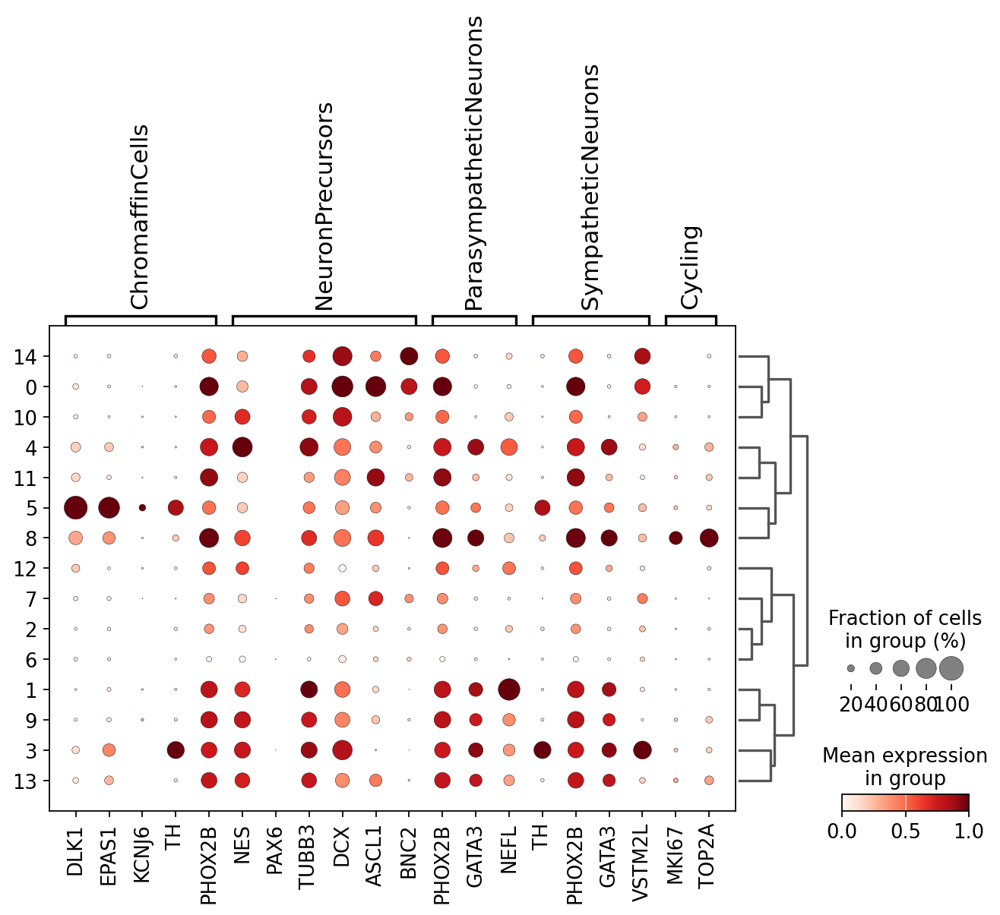

In [15]:
sc.tl.dendrogram(adata,groupby=f'leiden_{str(resolution_sel)}')
sc.pl.dotplot(adata,
              var_names=markers,
              groupby=f'leiden_{str(resolution_sel)}',
              standard_scale='var',
              dendrogram=True
             )

[3.4320538 3.4320538 4.1089087 3.4320538 3.4320538]


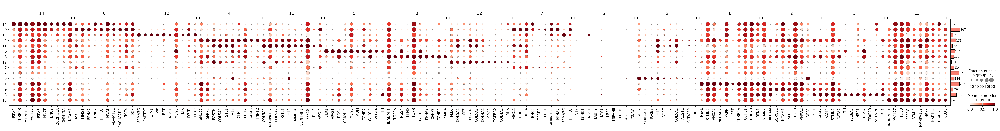

In [16]:
print(adata.X.data[:5])
adata.uns['log1p']['base']=None
sc.tl.rank_genes_groups(adata,groupby=f'leiden_{str(resolution_sel)}')
sc.tl.dendrogram(adata, groupby=f'leiden_{str(resolution_sel)}')
dp=sc.pl.rank_genes_groups_dotplot(adata, dendrogram=True, standard_scale='var', return_fig=True)
dp.add_totals().show()

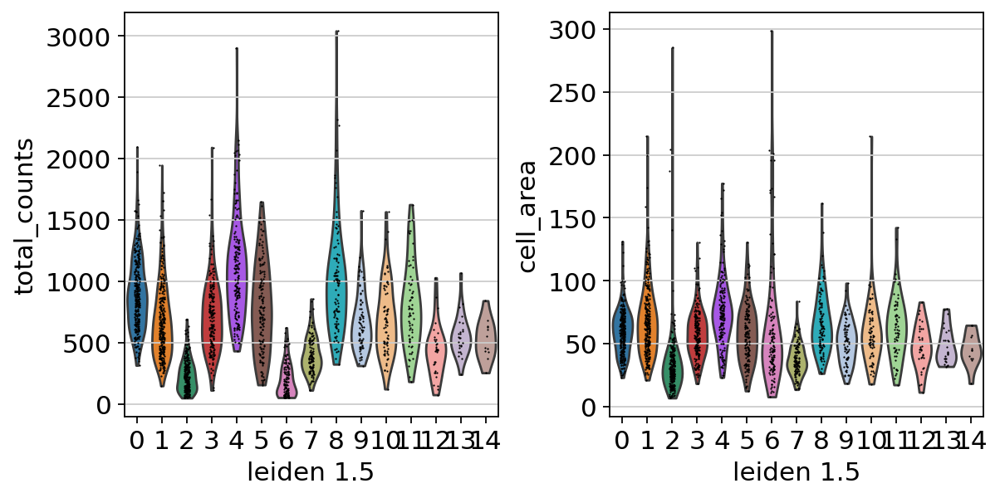

In [17]:
sc.pl.violin(adata,keys=['total_counts','cell_area'],groupby=f'leiden_{str(resolution_sel)}')

--> cluster 2 and 6 has lower total counts and smaller cell area, and no specific gene expression --> annotate as "unassigned"

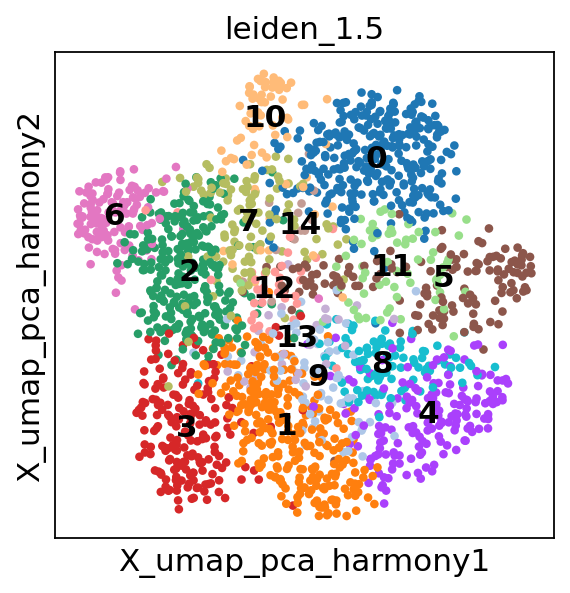

In [18]:
sc.pl.embedding(adata, basis=f"X_umap_{latent_space}",
                color=f'leiden_{str(resolution_sel)}',legend_loc='on data',
                )

In [19]:
# annotate
adata.obs['tmp_annotation'] = adata.obs[f'leiden_{str(resolution_sel)}'].copy()
adata.obs.replace({'tmp_annotation':{
    '0':'Neurons',
    '1':'Neurons',
    '2':'unassigned',
    '3':'Neurons',
    '4':'Neurons',
    '5':'Neurons',
    '6':'unassigned',
    '7':'Neurons',
    '8':'Neurons',
    '9':'Neurons',
    '10':'Neurons',
    '11':'Neurons',
    '12':'Neurons',
    '13':'Neurons',
    '14':'Neurons',
    '15':'Neurons',
}},inplace=True)
adata.obs['tmp_annotation'].value_counts()

/tmp/ipykernel_350881/479757587.py:3: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  adata.obs.replace({'tmp_annotation':{


tmp_annotation
Neurons       1597
unassigned     395
Name: count, dtype: int64

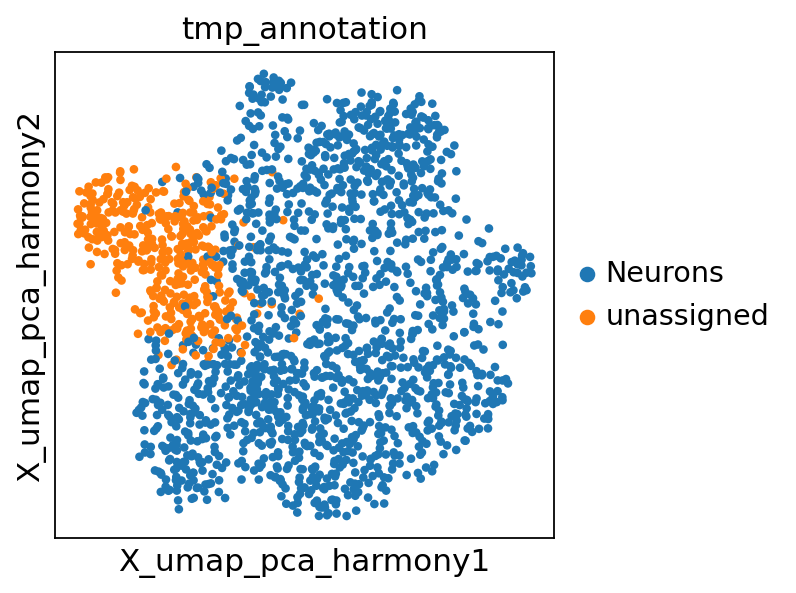

In [20]:
sc.pl.embedding(adata, basis=f"X_umap_{latent_space}",
                color='tmp_annotation'
                )

# Subset and reclustering

In [21]:
adata_sub = adata[adata.obs['tmp_annotation'].isin(['Neurons'])]

In [22]:
# drop leiden clustering results
resolutions_list = [0.2,0.4,0.6,1, 1.2,1.5,2]
for resolution in resolutions_list:
    adata_sub.obs.drop(f'leiden_{str(resolution)}',axis=1,inplace=True)
adata_sub

AnnData object with n_obs × n_vars = 1597 × 4270
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'n_genes', 'tissue_block_id', 'celltypist_coarse', 'conf_score_coarse', 'celltypist_coarse_fin', 'celltypist_coarse2midmod', 'conf_score_coarse2midmod', 'celltypist_mid_fin', 'celltypist_midmod2fine', 'conf_score_midmod2fine', 'pca_harmony_leiden_0.2', 'pca_harmony_leiden_0.3', 'pca_harmony_leiden_0.4', 'pca_harmony_leiden_0.5', 'pca_harmony_leiden_0.8', 'pca_harmony_leiden_1.0', 'pca_harmony_leiden_1.5', 'pca_harmony_leiden_2.0', 'pca_harmony_leiden_3.

In [23]:
## Remove mid-grain markers from the feature
# read in markers
midgrain_markers = pd.read_csv('/home/kk837/rfs/rfs-teichlab-nfs-iCNyzSAaucw/kk837/notebooks/Foetal/VisiumHD/re-seq_mpp0p3/sc_midgrain_markers.csv',
                               index_col=0)
# remove the markers of celltype of interest
midgrain_markers = midgrain_markers[midgrain_markers['group']!=celltype]
# remove
mask = [x not in list(midgrain_markers['names']) for x in adata_sub.var_names]
bdata = adata_sub[:,mask]
bdata

View of AnnData object with n_obs × n_vars = 1597 × 3822
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_150_genes', 'n_counts', 'n_genes', 'tissue_block_id', 'celltypist_coarse', 'conf_score_coarse', 'celltypist_coarse_fin', 'celltypist_coarse2midmod', 'conf_score_coarse2midmod', 'celltypist_mid_fin', 'celltypist_midmod2fine', 'conf_score_midmod2fine', 'pca_harmony_leiden_0.2', 'pca_harmony_leiden_0.3', 'pca_harmony_leiden_0.4', 'pca_harmony_leiden_0.5', 'pca_harmony_leiden_0.8', 'pca_harmony_leiden_1.0', 'pca_harmony_leiden_1.5', 'pca_harmony_leiden_2.0', 'pca_harmony_l

In [24]:
# remove cell cycle genes
cell_cycle_genes = ['MCM5','PCNA','TYMS','FEN1','MCM2','MCM4','RRM1','UNG','GINS2','MCM6','CDCA7','DTL','PRIM1','UHRF1','MLF1IP','HELLS','RFC2','RPA2','NASP',
                'RAD51AP1','GMNN','WDR76','SLBP','CCNE2','UBR7','POLD3','MSH2','ATAD2','RAD51','RRM2','CDC45','CDC6','EXO1','TIPIN','DSCC1','BLM','CASP8AP2',
                'USP1','CLSPN','POLA1','CHAF1B','BRIP1','E2F8','HMGB2','CDK1','NUSAP1','UBE2C','BIRC5','TPX2','TOP2A','NDC80','CKS2','NUF2','CKS1B','MKI67',
                'TMPO','CENPF','TACC3','FAM64A','SMC4','CCNB2','CKAP2L','CKAP2','AURKB','BUB1','KIF11','ANP32E','TUBB4B','GTSE1','KIF20B','HJURP','CDCA3','HN1',
                'CDC20','TTK','CDC25C','KIF2C','RANGAP1','NCAPD2','DLGAP5','CDCA2','CDCA8','ECT2','KIF23','HMMR','AURKA','PSRC1','ANLN','LBR','CKAP5','CENPE','CTCF',
                'NEK2','G2E3','GAS2L3','CBX5','CENPA']
mask = [x not in cell_cycle_genes for x in bdata.var_names]
bdata = bdata[:,mask]
bdata.shape

(1597, 3769)

In [25]:
# HVGs, using the object which doesn't have midgrain markers
sc.pp.highly_variable_genes(bdata, flavor='seurat', min_mean=0.0125, max_mean=3, min_disp=0.5)
print(f'number of hvgs: {sum(bdata.var.highly_variable)}')
# PCA using the degected HVGs
sc.tl.pca(bdata, use_highly_variable=True)
adata_sub.obsm['X_pca'] = bdata.obsm['X_pca'].copy()
# harmony integration
sce.pp.harmony_integrate(adata_sub, 'tissue_block_id', basis='X_pca', adjusted_basis='X_pca_harmony')
# create neighbour graph
latent_space = 'pca_harmony'
sc.pp.neighbors(adata_sub,n_neighbors=15,use_rep=f"X_{latent_space}",key_added=latent_space)
# visualisation with umap
sc.tl.umap(adata_sub,min_dist=0.5,neighbors_key=latent_space)
adata_sub.obsm[f"X_umap_{latent_space}"]=adata_sub.obsm["X_umap"]
del adata_sub.obsm["X_umap"]

/home/kk837/.conda/envs/generic_env/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:698: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns["hvg"] = {"flavor": flavor}
/home/kk837/.conda/envs/generic_env/lib/python3.10/site-packages/scanpy/preprocessing/_pca/__init__.py:438: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


number of hvgs: 818


2025-06-12 17:39:31,715 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-06-12 17:39:31,970 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-06-12 17:39:32,016 - harmonypy - INFO - Iteration 1 of 10
2025-06-12 17:39:32,138 - harmonypy - INFO - Iteration 2 of 10
2025-06-12 17:39:32,245 - harmonypy - INFO - Converged after 2 iterations
/home/kk837/.conda/envs/generic_env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


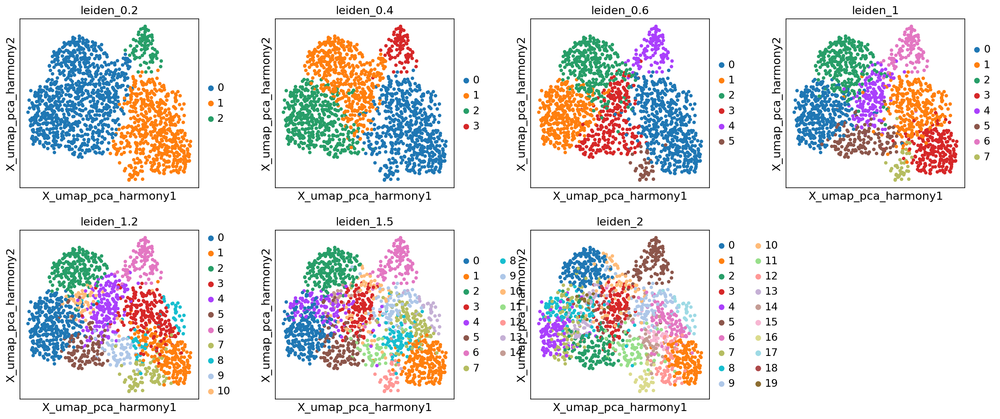

CPU times: user 2.66 s, sys: 106 ms, total: 2.77 s
Wall time: 2.78 s


In [26]:
%%time
# reclustering
# leiden clustering
resolutions_list = [0.2,0.4,0.6,1, 1.2,1.5,2]
for resolution in resolutions_list:
    sc.tl.leiden(adata_sub,neighbors_key=latent_space,
                 resolution=resolution,key_added=f'leiden_{str(resolution)}',n_iterations=2)
sc.pl.embedding(adata_sub, basis=f"X_umap_{latent_space}",
                color=[f'leiden_{str(resolution)}' for resolution in resolutions_list],
                wspace=0.3)

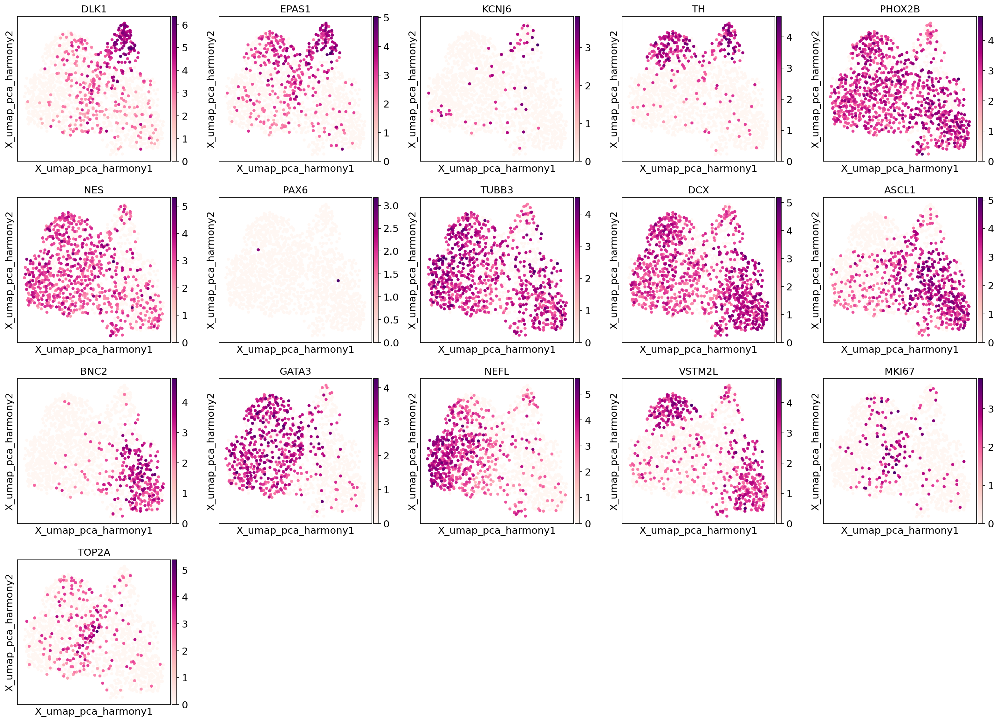

In [27]:
sc.pl.embedding(adata_sub, basis=f"X_umap_{latent_space}",
                color=genes,
               ncols=5, wspace=0.2,cmap='RdPu',vmax='p100')

In [28]:
sub_resolution_sel = 1

categories: 0, 1, 2, etc.
var_group_labels: ChromaffinCells, NeuronPrecursors, ParasympatheticNeurons, etc.


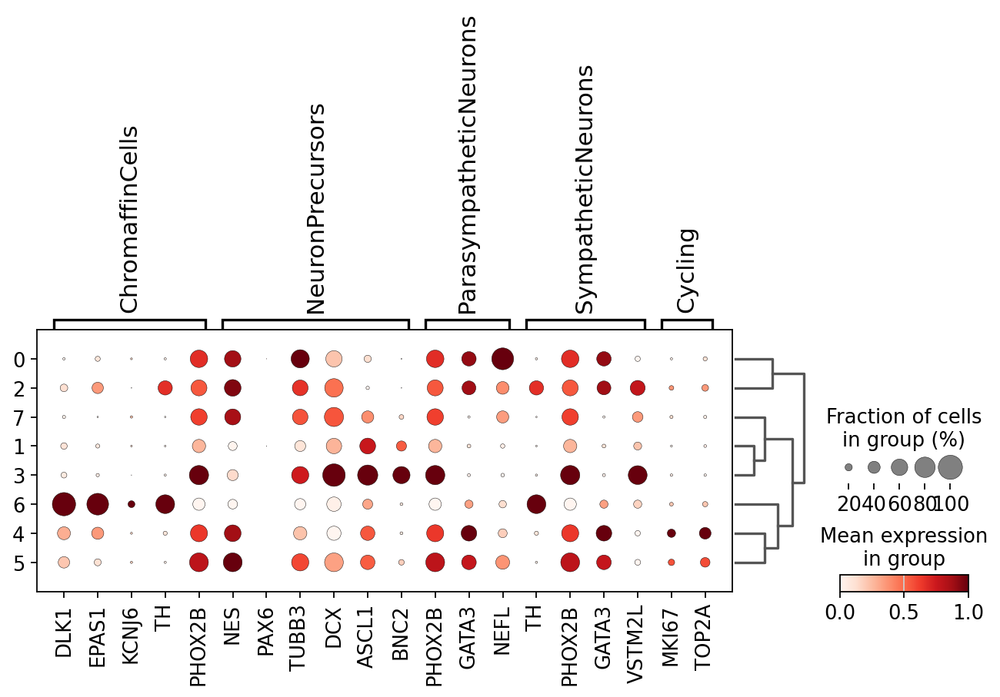

In [29]:
sc.tl.dendrogram(adata_sub,groupby=f'leiden_{str(sub_resolution_sel)}')
sc.pl.dotplot(adata_sub,
              var_names=markers,
              groupby=f'leiden_{str(sub_resolution_sel)}',
              standard_scale='var',
              dendrogram=True
             )

[3.4320538 3.4320538 4.1089087 3.4320538 3.4320538]


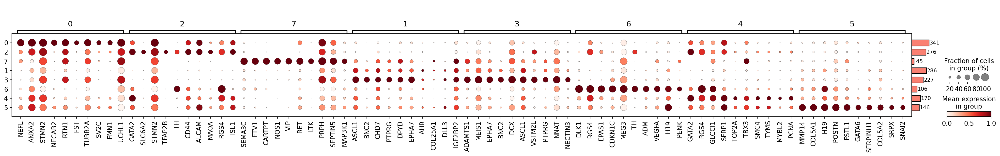

In [30]:
# DEG analysis
print(adata_sub.X.data[:5])
adata_sub.uns['log1p']['base']=None
sc.tl.rank_genes_groups(adata_sub,groupby=f'leiden_{str(sub_resolution_sel)}')
sc.tl.dendrogram(adata_sub, groupby=f'leiden_{str(sub_resolution_sel)}')
dp=sc.pl.rank_genes_groups_dotplot(adata_sub, dendrogram=True, standard_scale='var', return_fig=True)
dp.add_totals().show()

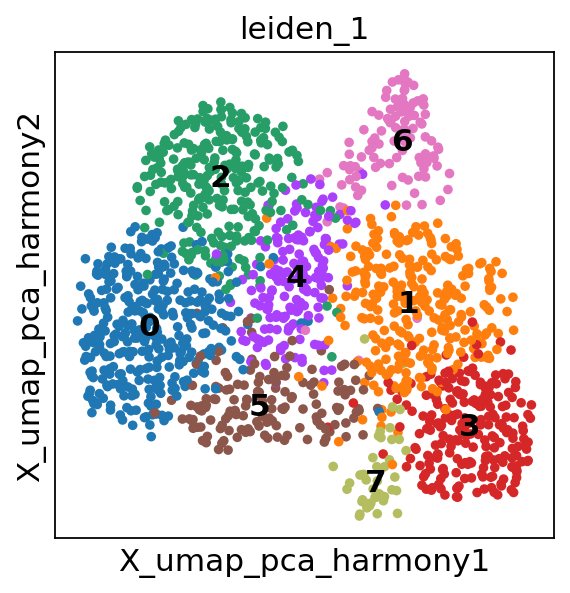

In [31]:
sc.pl.embedding(adata_sub, basis=f"X_umap_{latent_space}",
                color=f'leiden_{str(sub_resolution_sel)}',legend_loc='on data',
                wspace=0.3)

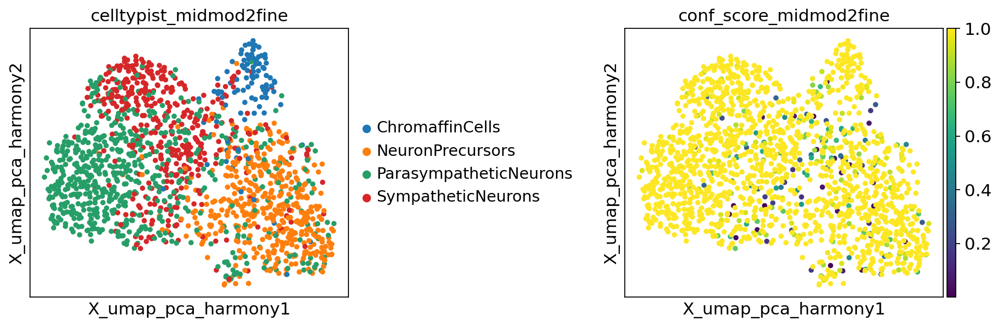

In [32]:
sc.pl.embedding(adata_sub, basis=f"X_umap_{latent_space}",
                color=['celltypist_midmod2fine', 'conf_score_midmod2fine'],
                wspace=0.7)

In [33]:
# annotate
adata_sub.obs['fine_grain_manual'] = adata_sub.obs[f'leiden_{str(sub_resolution_sel)}'].copy()
adata_sub.obs.replace({'fine_grain_manual':{
    '0':'ParasympatheticNeurons',
    '1':'NeuronPrecursors',
    '2':'SympatheticNeurons',
    '3':'NeuronPrecursors',
    '4':'ParasympatheticNeurons',
    '5':'ParasympatheticNeurons',
    '6':'ChromaffinCells',
    '7':'EntericLikeNeurons'
}},inplace=True)
adata_sub.obs['fine_grain_manual'].value_counts()

/tmp/ipykernel_350881/3142940995.py:3: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  adata_sub.obs.replace({'fine_grain_manual':{


fine_grain_manual
ParasympatheticNeurons    657
NeuronPrecursors          513
SympatheticNeurons        276
ChromaffinCells           106
EntericLikeNeurons         45
Name: count, dtype: int64

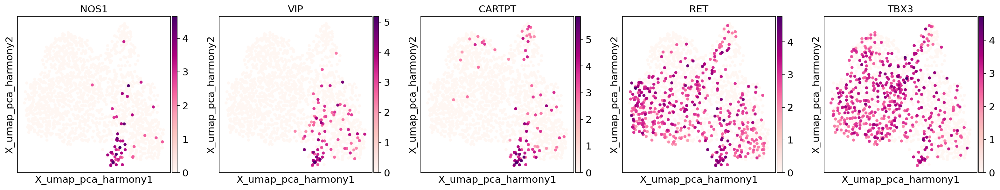

In [34]:
sc.pl.embedding(adata_sub, basis=f"X_umap_{latent_space}",
                color=['NOS1', 'VIP', 'CARTPT', 'RET','TBX3'],
               ncols=5, wspace=0.2,cmap='RdPu',vmax='p100')

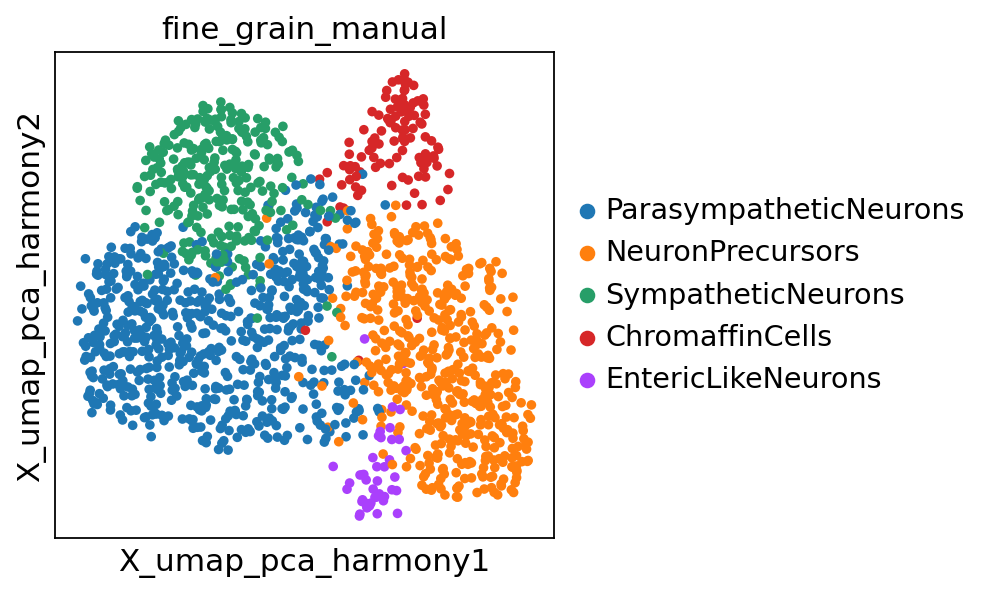

In [35]:
sc.pl.embedding(adata_sub, basis=f"X_umap_{latent_space}",
                color='fine_grain_manual',
                wspace=0.3)

categories: ParasympatheticNeurons, NeuronPrecursors, SympatheticNeurons, etc.
var_group_labels: ChromaffinCells, NeuronPrecursors, ParasympatheticNeurons, etc.


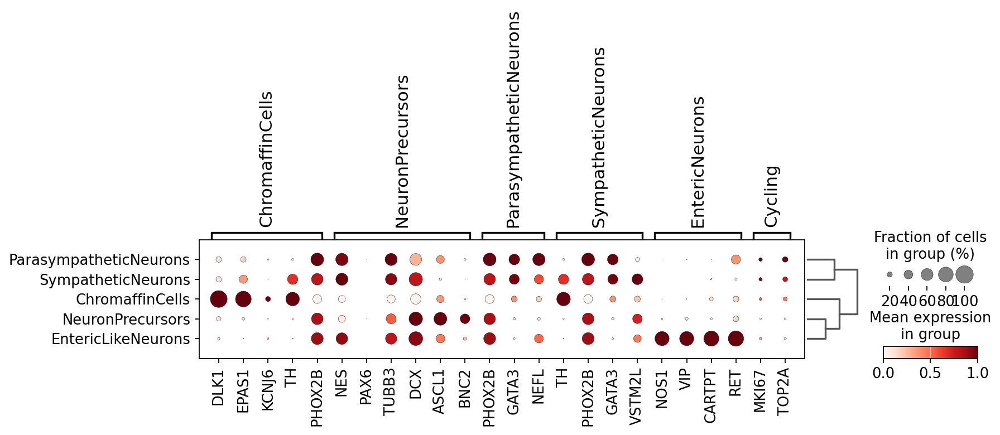

In [36]:
# markers for fine-grained cell types
markers = {
    "ChromaffinCells": [
        'DLK1',
        'EPAS1',
        'KCNJ6',
        "TH",    # Tyrosine hydroxylase
        "PNMT",  # Phenylethanolamine N-methyltransferase
        "CHGA",  # Chromogranin A
        "CHGB",  # Chromogranin B
        "PHOX2B"
    ],
    "NeuronPrecursors": [
        "NES",    # Nestin
        "PAX6",   # Paired box 6
        "TUBB3",  # Tubulin Beta 3 Class III
        "DCX",     # Doublecortin
        'ASCL1','NELL2','BNC2'
    ],
    "ParasympatheticNeurons": [
        "PHOX2B",
        "CHAT",    # Choline O-Acetyltransferase
        "SLC18A3", # Solute Carrier Family 18 Member A3 (Vesicular Acetylcholine Transporter)
        "GATA3",
        'NEFL','SST'
    ],
    "SympatheticNeurons": [
        "TH",
        "PHOX2B",
        "GATA3",
        "CHGA",
        "CHGB",
        'DBH','VSTM2L'
    ],
    'EntericNeurons':['NOS1', 'VIP', 'CARTPT', 'RET'],
    'Cycling':['MKI67','TOP2A']
}
genes = []
for g in markers.values():
    genes = genes + [x for x in g if (x in adata.var_names)&(x not in genes)]
for key in markers.keys():
    markers[key]=[x for x in markers[key] if x in adata.var_names]

sc.tl.dendrogram(adata_sub,groupby='fine_grain_manual')
sc.pl.dotplot(adata_sub,
              var_names=markers,
              groupby='fine_grain_manual',
              standard_scale='var',
              dendrogram=True
             )

# Transfer annotation to the original adata

In [37]:
adata.obs['fine_grain_manual'] = adata.obs['tmp_annotation'].astype('str').copy()
adata.obs.loc[adata_sub.obs_names,'fine_grain_manual'] = adata_sub.obs['fine_grain_manual']

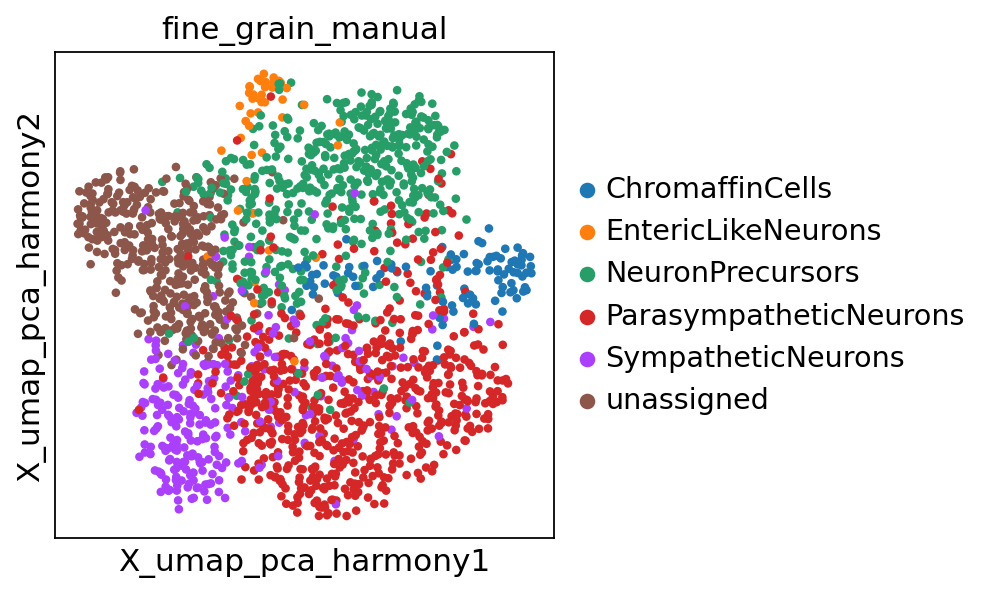

In [38]:
sc.pl.embedding(adata, basis=f"X_umap_{latent_space}",
                color='fine_grain_manual'
                )

/tmp/ipykernel_350881/4023824168.py:3: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(slide,color=['fine_grain_manual'],# groups='SinoatrialNodePacemakerCells',


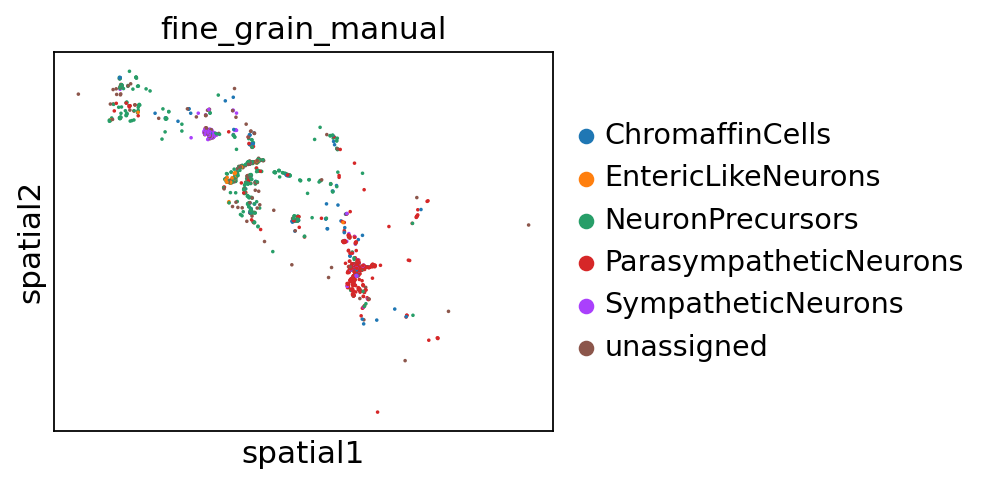

/tmp/ipykernel_350881/4023824168.py:3: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(slide,color=['fine_grain_manual'],# groups='SinoatrialNodePacemakerCells',


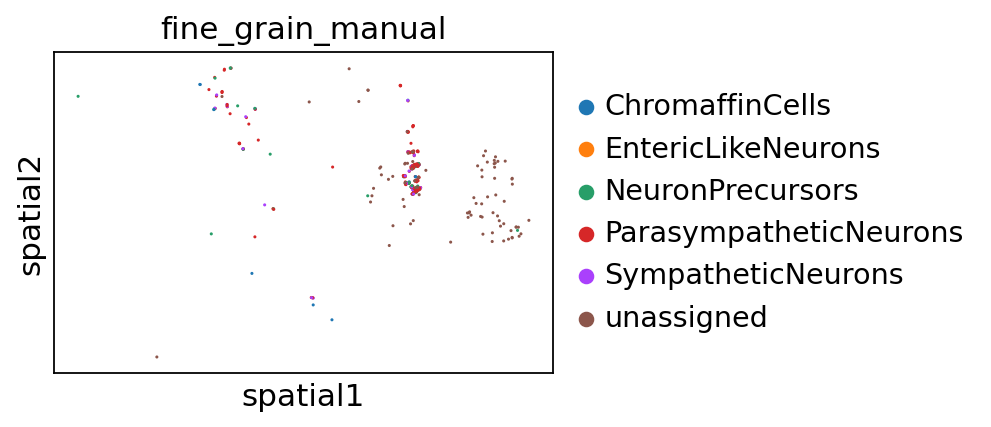

In [39]:
for tissue_id in ['C194-HEA-0-FFPE-1', 'Hst45-HEA-0-FFPE-1']:
    slide = adata[adata.obs['tissue_block_id']==tissue_id]
    sc.pl.spatial(slide,color=['fine_grain_manual'],# groups='SinoatrialNodePacemakerCells',
                  spot_size=60,vmax='p100')

/tmp/ipykernel_350881/2352066969.py:3: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(slide,color=['fine_grain_manual'],groups='ParasympatheticNeurons',


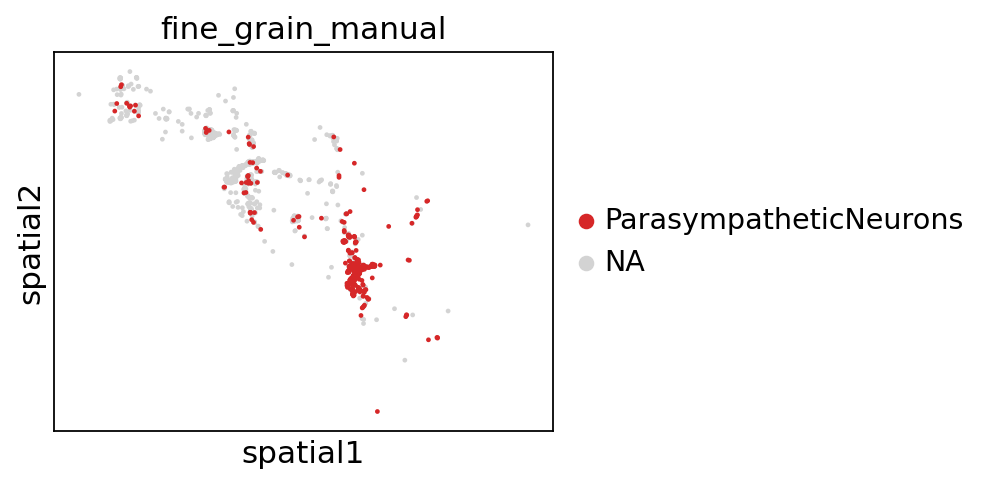

/tmp/ipykernel_350881/2352066969.py:3: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(slide,color=['fine_grain_manual'],groups='ParasympatheticNeurons',


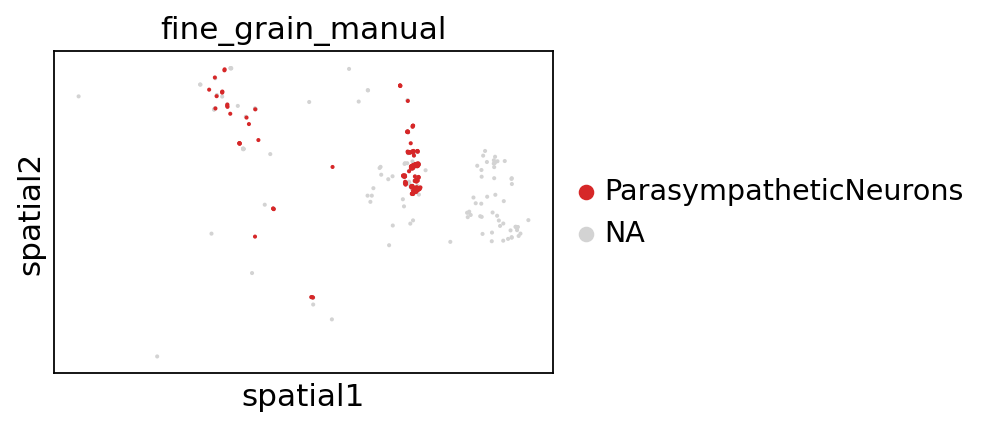

In [40]:
for tissue_id in ['C194-HEA-0-FFPE-1', 'Hst45-HEA-0-FFPE-1']:
    slide = adata[adata.obs['tissue_block_id']==tissue_id]
    sc.pl.spatial(slide,color=['fine_grain_manual'],groups='ParasympatheticNeurons',
                  spot_size=80,vmax='p100')

/tmp/ipykernel_350881/1588966400.py:3: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(slide,color=['fine_grain_manual'],groups='SympatheticNeurons',


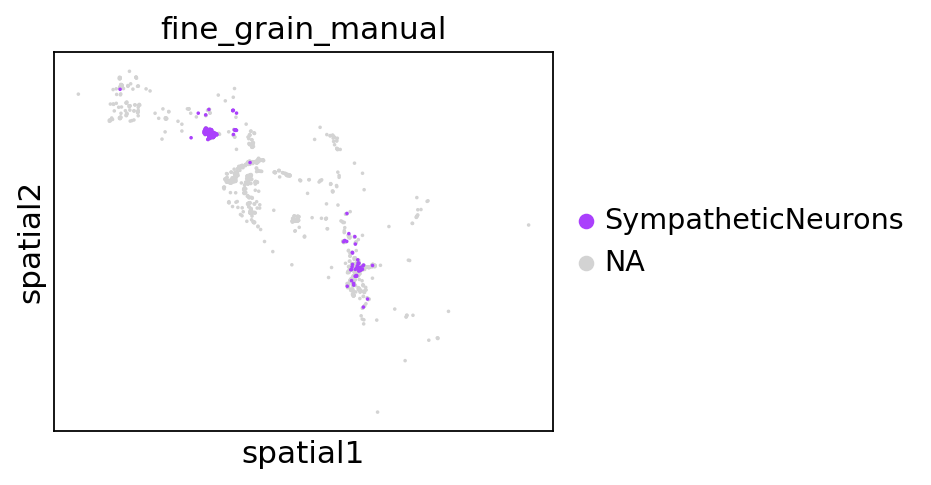

/tmp/ipykernel_350881/1588966400.py:3: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(slide,color=['fine_grain_manual'],groups='SympatheticNeurons',


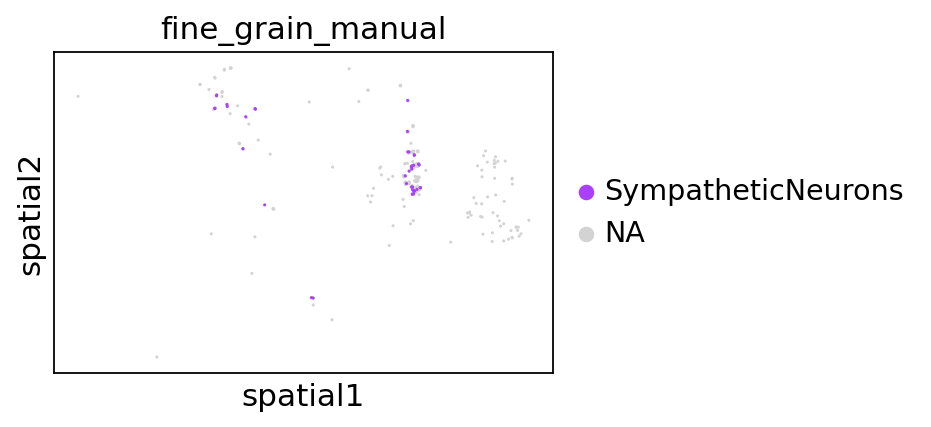

In [41]:
for tissue_id in ['C194-HEA-0-FFPE-1', 'Hst45-HEA-0-FFPE-1']:
    slide = adata[adata.obs['tissue_block_id']==tissue_id]
    sc.pl.spatial(slide,color=['fine_grain_manual'],groups='SympatheticNeurons',
                  spot_size=60,vmax='p100')

/tmp/ipykernel_350881/1078245424.py:3: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(slide,color=['fine_grain_manual'],groups='EntericLikeNeurons',


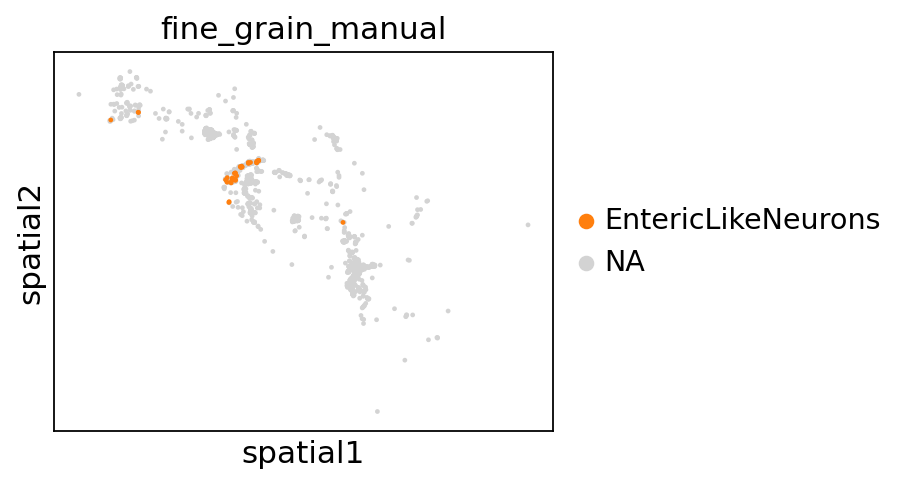

/tmp/ipykernel_350881/1078245424.py:3: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(slide,color=['fine_grain_manual'],groups='EntericLikeNeurons',


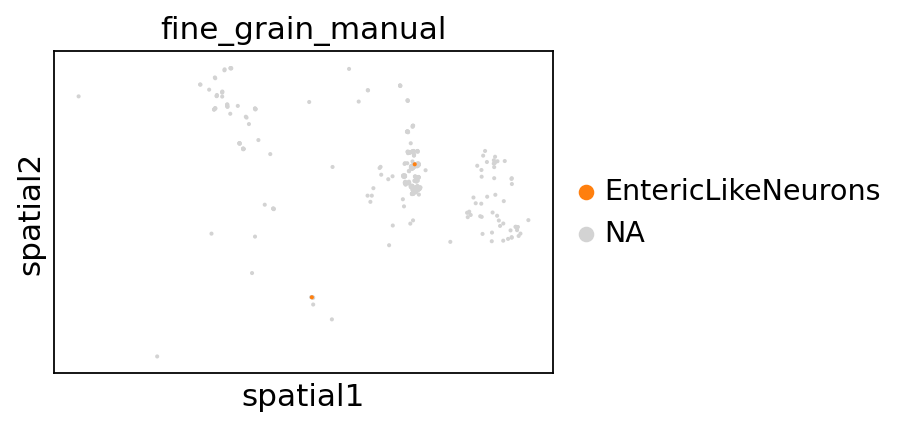

In [42]:
for tissue_id in ['C194-HEA-0-FFPE-1', 'Hst45-HEA-0-FFPE-1']:
    slide = adata[adata.obs['tissue_block_id']==tissue_id]
    sc.pl.spatial(slide,color=['fine_grain_manual'],groups='EntericLikeNeurons',
                  spot_size=80,vmax='p100')

# Save

In [43]:
# save
adata.write(f'{adata_dir}/{sample_id}_5K_{celltype}_lognorm.h5ad')
print(f'{adata_dir}/{sample_id}_5K_{celltype}_lognorm.h5ad')

/home/kk837/rds/rds-teichlab-C9woKbOCf2Y/kk837/Foetal/anndata_objects/Xenium/subsets/C194-HEA-0-FFPE-1_Hst45-HEA-0-FFPE-1_concat_5K_Neurons_lognorm.h5ad
